In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.graphics.mosaicplot import mosaic
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from lightgbm import early_stopping

## 데이터 로드

In [2]:
train_df = pd.read_csv('C:/Users/jeonghwanlee/Downloads/train.csv')
# origin_df = pd.read_csv('C:/Users/jeonghwanlee/Downloads/Churn_Modelling.csv')
train_df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


### 데이터 전처리

In [3]:
train_df = train_df.drop(['id','Surname'], axis=1)
train_df.drop_duplicates(inplace = True)
train_df.dropna(inplace=True)

In [4]:
train_df = train_df.drop(['CustomerId'], axis = 1)
train_df_encoded = pd.get_dummies(train_df, columns=['Geography',
                                       'Gender',
                                       'IsActiveMember',
                                       'HasCrCard',
                                       'NumOfProducts'])
train_df_encoded.head(3)

,CreditScore,Age,Tenure,Balance,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,IsActiveMember_0.0,IsActiveMember_1.0,HasCrCard_0.0,HasCrCard_1.0,NumOfProducts_1,NumOfProducts_2,NumOfProducts_3,NumOfProducts_4
0,668,33.0,3,0.0,181449.97,0,True,False,False,False,True,True,False,False,True,False,True,False,False
1,627,33.0,1,0.0,49503.50,0,True,False,False,False,True,False,True,False,True,False,True,False,False
2,678,40.0,10,0.0,184866.69,0,True,False,False,False,True,True,False,False,True,False,True,False,False


## 데이터 나누기

In [5]:
X = train_df_encoded.drop('Exited', axis = 1)
y = train_df_encoded['Exited']

X_train, X_test, y_train, y_test  = train_test_split(X, y, test_size = 0.2, random_state = 13)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((132003, 18), (33001, 18), (132003,), (33001,))

In [14]:
y_train.value_counts()

Exited
0    104112
1     27891
Name: count, dtype: int64

### 데이터 오버샘플링

In [6]:
smote = SMOTE(random_state=13)
X_train_over, y_train_over = smote.fit_resample(X_train, y_train)
X_train_over.shape, y_train_over.shape

((208224, 18), (208224,))

### 모델 성능 출력 함수

In [7]:
def get_clf_eval(y_test, pred, pred_proba):
    acc = accuracy_score(y_test,pred)
    pre = precision_score(y_test,pred)
    re = recall_score(y_test,pred)
    f1 = f1_score(y_test,pred)
    auc = roc_auc_score(y_test,pred_proba)
    
    # confusion = confusion_matrix(y_test, pred)
    
    # print("=> confusion matrix")
    # print(confusion)
    # print('===========')

    # print('Accuracy : {0:.4f}, Precision : {1:.4f}'.format(acc,pre))
    # print('Recall : {0:.4f}, F1: {1:.4f}, ROC_AUC: {2:.4f}'.format(re, f1, auc))
    return acc, pre, re, f1, auc

In [8]:
def print_clf_eval(y_test, pred, pred_proba):
    confusion = confusion_matrix(y_test, pred)
    acc, pre, re, f1, auc = get_clf_eval(y_test, pred, pred_proba)

    print("=> confusion matrix")
    print(confusion)
    print('===========')

    print('Accuracy : {0:.4f}, Precision : {1:.4f}'.format(acc,pre))
    print('Recall : {0:.4f}, F1: {1:.4f}, ROC_AUC: {2:.4f}'.format(re, f1, auc))

### 모델별 결과 정리 함수

In [9]:
def get_result(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    pred_proba = model.predict_proba(X_test)

    return get_clf_eval(y_test, pred, pred_proba[:,1])

In [10]:
def get_result_pd(models, model_names, X_train, y_train, X_test, y_test):
    col_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC']
    tmp =[]

    for model in models:
        tmp.append(get_result(model, X_train, y_train, X_test, y_test))

    return pd.DataFrame(tmp, columns=col_names, index=model_names)

In [11]:
def draw_roc_curve(models, model_names, X_test, y_test):
    plt.figure(figsize=(8,8))

    for model in range(len(models)):
        pred = models[model].predict_proba(X_test)[:, 1]
        fpr, tpr, thresholds = roc_curve(y_test, pred)
        plt.plot(fpr, tpr, label= model_names[model])

    plt.plot([0,1],[0,1], 'k--', label='random guess')
    plt.title('ROC')
    plt.legend()
    plt.grid()
    plt.show()

## Modeling

### class_weight로 불균형 데이터 처리

In [16]:
col_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'ROC_AUC']
model_names = ['LogisticReg', 'DecisionTree', 'RandomForest', 'LightGBM', 'XGBoost']

scale_pos_weight = y_train.value_counts()[0] / y_train.value_counts()[1]

lr = LogisticRegression(class_weight = 'balanced', random_state = 13, solver = 'liblinear')
dt = DecisionTreeClassifier(class_weight = 'balanced', random_state = 13, max_depth = 5)
rf = RandomForestClassifier(class_weight = 'balanced', random_state = 13, max_depth = 5, n_jobs = -1)
lgbm = LGBMClassifier(class_weight = 'balanced', random_state = 13, verbose = 0)
xgb = XGBClassifier(scale_pos_weight = scale_pos_weight, random_state = 13, max_depth = 5)

In [62]:
models = [lr, dt, rf, lgbm, xgb]
result = get_result_pd(models, model_names, X_train, y_train, X_test, y_test)
result 

=> confusion matrix
[[19948  6029]
 [ 1434  5590]]
Accuracy : 0.7739, Precision : 0.4811
Recall : 0.7958, F1: 0.5997, ROC_AUC: 0.8601
=> confusion matrix
[[21326  4651]
 [ 1795  5229]]
Accuracy : 0.8047, Precision : 0.5293
Recall : 0.7444, F1: 0.6187, ROC_AUC: 0.8675
=> confusion matrix
[[20247  5730]
 [ 1339  5685]]
Accuracy : 0.7858, Precision : 0.4980
Recall : 0.8094, F1: 0.6166, ROC_AUC: 0.8765
=> confusion matrix
[[21358  4619]
 [ 1469  5555]]
Accuracy : 0.8155, Precision : 0.5460
Recall : 0.7909, F1: 0.6460, ROC_AUC: 0.8880
=> confusion matrix
[[21360  4617]
 [ 1492  5532]]
Accuracy : 0.8149, Precision : 0.5451
Recall : 0.7876, F1: 0.6443, ROC_AUC: 0.8863


,Accuracy,Precision,Recall,F1,AUC
LogisticReg,0.773855,0.481109,0.795843,0.599689,0.860080
DecisionTree,0.804673,0.529251,0.744448,0.618670,0.867521
RandomForest,0.785794,0.498029,0.809368,0.616628,0.876481
LightGBM,0.815521,0.546000,0.790860,0.646005,0.887964
XGBoost,0.814884,0.545078,0.787585,0.644267,0.886317


- class_weight = 'balanced'로 불균형 데이터를 처리했을시 모든 모델의 Recall이 0.8정도의 수치를 보이면서 ROC_AUC도 0.86 ~ 0.88로 준수한 성능 수치를 보이고 있다.
- Recall 성능이 가장 좋은 모델은 LogisticReg와 RandomForest로 보인다.

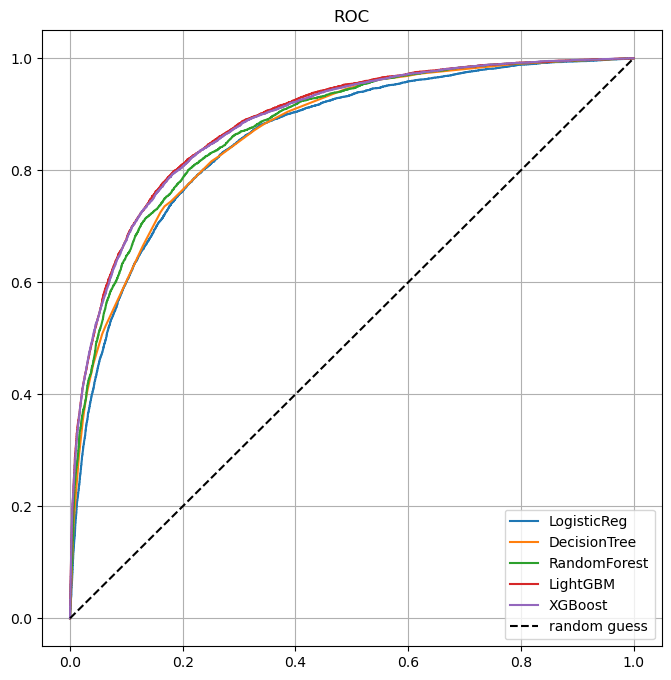

In [63]:
draw_roc_curve(models, model_names, X_test, y_test)

### SMOTE 오버샘플링 

In [58]:
lr = LogisticRegression(random_state = 13, solver = 'liblinear')
dt = DecisionTreeClassifier(random_state = 13, max_depth = 5)
rf = RandomForestClassifier(random_state = 13, max_depth = 5, n_jobs = -1)
lgbm = LGBMClassifier(random_state = 13, verbose = 0)
xgb = XGBClassifier(random_state = 13, max_depth = 5)

In [59]:
result = get_result_pd(models, model_names, X_train_over, y_train_over, X_test, y_test)
result 

=> confusion matrix
[[18647  7330]
 [ 2204  4820]]
Accuracy : 0.7111, Precision : 0.3967
Recall : 0.6862, F1: 0.5028, ROC_AUC: 0.7530
=> confusion matrix
[[22578  3399]
 [ 2311  4713]]
Accuracy : 0.8270, Precision : 0.5810
Recall : 0.6710, F1: 0.6228, ROC_AUC: 0.8586
=> confusion matrix
[[22543  3434]
 [ 2265  4759]]
Accuracy : 0.8273, Precision : 0.5809
Recall : 0.6775, F1: 0.6255, ROC_AUC: 0.8729
=> confusion matrix
[[24328  1649]
 [ 2872  4152]]
Accuracy : 0.8630, Precision : 0.7157
Recall : 0.5911, F1: 0.6475, ROC_AUC: 0.8884
=> confusion matrix
[[21139  4838]
 [ 1413  5611]]
Accuracy : 0.8106, Precision : 0.5370
Recall : 0.7988, F1: 0.6422, ROC_AUC: 0.8866


,Accuracy,Precision,Recall,F1,AUC
LogisticReg,0.711100,0.396708,0.686219,0.502764,0.753004
DecisionTree,0.826975,0.580991,0.670985,0.622754,0.858570
RandomForest,0.827308,0.580862,0.677534,0.625485,0.872915
LightGBM,0.863004,0.715739,0.591116,0.647485,0.888355
XGBoost,0.810581,0.536989,0.798833,0.642248,0.886625


- SMOTE로 오버샘플링하여 불균형 데이터를 처리했을 때 class_weight로 불균형 데이터를 처리했을 때보다 XGBoost를 제외한 전체적인 모델의 Recall의 지표가 하락한 것으로 보이고
- 이 두가지로만 Recall 지표를 분석해보았을 때는 SMOTE로 불균형 데이터의 개수를 동일하게 맞추는 것보다 class_weight로 타켓의 가중치를 빈도에 반비례하도록 부여하여 이탈(1) 값에 더 주의를 기울여 최대한 많은 이탈을 예측할 수 있도록  Recall의 성능을 올린 것으로 보이며, 따라서 Recall의 성능을 높이는 것에 있어서 더 좋은 선택이 될 수 있다.


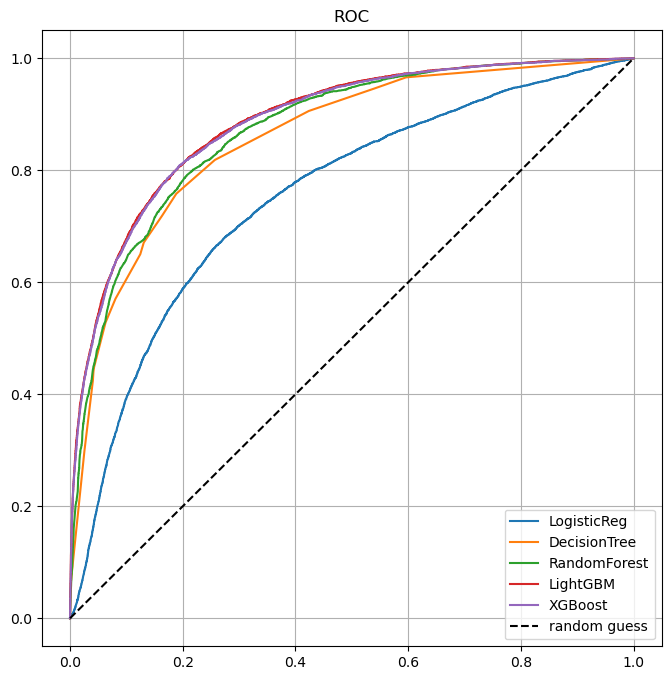

In [60]:
draw_roc_curve(models, model_names, X_test, y_test)

## class_weight로 불균형 처리 GridSearch

### 1. Decision Tree

In [113]:
params = {'max_depth': [3, 5, 7, 10]}

dt = DecisionTreeClassifier(class_weight = 'balanced', random_state = 13, max_depth = 5)

dt_gs = GridSearchCV(estimator=dt, param_grid=params, cv = 5,  scoring='recall')
dt_gs.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=5, random_state=13),
             param_grid={'max_depth': [3, 5, 7, 10]}, scoring='recall')

In [114]:
dt_gs.best_score_, dt_gs.best_params_

(0.8185441345731841, {'max_depth': 3})

In [115]:
dt_gs = dt_gs.best_estimator_
dt_pred = dt_gs.predict(X_test)
dt_proba = dt_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, dt_pred, dt_proba)

=> confusion matrix
[[19333  6644]
 [ 1334  5690]]
Accuracy : 0.7582, Precision : 0.4613
Recall : 0.8101, F1: 0.5879, ROC_AUC: 0.8471


### 2. Logsitic Regression GridSearch

 Logistic Regression 하이퍼 파라미터 종류
- C: 규제 강도를 나타내는 매개변수입니다. 값이 작을수록 규제가 강해지고, 모델이 단순해집니다. 기본값은 1.0입니다.
- penalty: 규제 유형을 지정하는 매개변수입니다. 'l1' 또는 'l2'를 선택할 수 있으며, 기본값은 'l2'입니다. 'l1'은 L1 규제를 나타내며, 'l2'는 L2 규제를 나타냅니다.
   - l1 : 라쏘회귀, 모델의 설명력에 기여하지 못하는 독립변수의 회귀계수를 0으로 만든다. 특성이 제외됨(모델의 단순화)
   - l2 : 릿지회귀, 모델의 설명력에 기여하지 못하는 독립변수의 회귀계수를 가능한 작게 만들어 특성이 출력에 주는 영향을 최소화
- solver: 비용함수의 최솟값을 어떠한 방법으로 찾을 것인지를 지정하는 역할로 최적화에 사용할 알고리즘을 지정하는 매개변수이다.
 다양한 최적화 알고리즘이 있으며, 예를 들어, 'saga', 'liblinear', 'newton-cg' 등이 있습니다.
     - newton-cg : 경사하강법과 마찬가지로 여러 번의 업데이트를 통해서 비용함수를 최소화하는 파라미터의 값을 찾는 방법이다. 하지만 2차 도함수를 계산하는 것이 필요하다는 단점
     - liblinear : 경사하강법은 한 번에 여러개의 파라미터를 업데이트하지만, liblinear은 한 번에 하나의 파라미터만 업데이트한다는 점이 다르다.
     - saga :  경사하강법과 유사하게 작동하지만, 차이점은 이전 업데이트 단계에서의 경사값을 현재 업데이트에 사용한다는 점이다. 이렇게 하면 학습속도가 더 빨라지는 장점이 있다.
- max_iter: 최적화 알고리즘의 최대 반복 횟수를 나타내는 매개변수입니다. 기본값은 100입니다.

In [117]:
params = {'C': [0.01, 0.1, 1, 10, 100],
              'penalty': ['l1', 'l2'],
              'solver': ['saga', 'liblinear', 'lbfgs'],
              'max_iter': [100, 300, 500]}

lr = LogisticRegression(class_weight = 'balanced', random_state = 13, solver = 'liblinear')

lr_gs = GridSearchCV(estimator=lr, param_grid=params, cv = 3, scoring='recall', n_jobs = -1)
lr_gs.fit(X_train,y_train)

GridSearchCV(cv=3,
             estimator=LogisticRegression(class_weight='balanced',
                                          random_state=13, solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'max_iter': [100, 300, 500], 'penalty': ['l1', 'l2'],
                         'solver': ['saga', 'liblinear', 'lbfgs']},
             scoring='recall')

In [118]:
lr_gs.best_score_, lr_gs.best_params_

(0.7953820228747625,
 {'C': 0.01, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'})

In [119]:
lr_gs = lr_gs.best_estimator_
lr_pred = lr_gs.predict(X_test)
lr_proba = lr_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, lr_pred, lr_proba)

=> confusion matrix
[[20524  5453]
 [ 1436  5588]]
Accuracy : 0.7912, Precision : 0.5061
Recall : 0.7956, F1: 0.6187, ROC_AUC: 0.8710


### 3. Random Forest GridSearch

In [120]:
params = {
	'n_estimators':[50, 100, 200],
	'max_depth':[3, 5, 10],
	'min_samples_leaf':[8, 12, 18],
	'min_samples_split':[8, 12, 18]
}

rf = RandomForestClassifier(class_weight = 'balanced', random_state = 13, max_depth = 3, n_jobs = -1)
rf_gs = GridSearchCV(estimator = rf, cv = 3, param_grid = params, n_jobs = -1, scoring='recall')
rf_gs.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=3, n_jobs=-1,
                                              random_state=13),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 10],
                         'min_samples_leaf': [8, 12, 18],
                         'min_samples_split': [8, 12, 18],
                         'n_estimators': [50, 100, 200]},
             scoring='recall')

In [121]:
rf_gs.best_score_, rf_gs.best_params_

(0.8115162597253595,
 {'max_depth': 5,
  'min_samples_leaf': 12,
  'min_samples_split': 8,
  'n_estimators': 100})

In [122]:
rf_gs = rf_gs.best_estimator_
rf_pred = rf_gs.predict(X_test)
rf_proba = rf_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, rf_pred, rf_proba)

=> confusion matrix
[[20265  5712]
 [ 1338  5686]]
Accuracy : 0.7864, Precision : 0.4989
Recall : 0.8095, F1: 0.6173, ROC_AUC: 0.8766


### 4. LightGBM GridSearch

In [123]:
params = {
    'boosting_type': ['gbdt'],
    'n_estimators': [100, 300, 1000],
    'max_depth' : [3, 5, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 63, 127],
    'subsample': [0.8, 0.9, 1.0],
}

lgbm = LGBMClassifier(class_weight = 'balanced', random_state = 13, verbose = 0)

lgbm_gs = GridSearchCV(estimator = lgbm, param_grid = params, cv = 3,   scoring='recall')
lgbm_gs = lgbm_gs.fit(X_train, y_train, eval_set = [(X_test, y_test)], callbacks=[early_stopping(10, verbose=0)])

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [124]:
lgbm_gs.best_score_, lgbm_gs.best_params_

(0.8313792979814277,
 {'boosting_type': 'gbdt',
  'learning_rate': 0.01,
  'max_depth': 3,
  'n_estimators': 100,
  'num_leaves': 31,
  'subsample': 0.8})

In [125]:
lgbm_gs = lgbm_gs.best_estimator_
lgbm_pred = lgbm_gs.predict(X_test)
lgbm_pred_proba = lgbm_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, lgbm_pred, lgbm_pred_proba)

=> confusion matrix
[[19005  6972]
 [ 1184  5840]]
Accuracy : 0.7529, Precision : 0.4558
Recall : 0.8314, F1: 0.5888, ROC_AUC: 0.8653


### 5. XGBoost GridSearch

In [126]:
params = {
    'n_estimators': [100, 300, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 10],
    'subsample': [0.8]
}

xgb = XGBClassifier(scale_pos_weight = scale_pos_weight, random_state = 13, max_depth = 3, verbose = 0)

xgb_gs = GridSearchCV(estimator = xgb, param_grid = params, cv = 3, verbose = 0, n_jobs = -1,   scoring='recall')
xgb_gs.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=3,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=13, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 5, 10],
                         'n_estimators': [100, 300, 1000], 'subsample': [0.8]},
             scoring='recall')

In [127]:
xgb_gs.best_score_, xgb_gs.best_params_

(0.8306622207880677,
 {'learning_rate': 0.01,
  'max_depth': 3,
  'n_estimators': 100,
  'subsample': 0.8})

In [128]:
xgb_gs = xgb_gs.best_estimator_
xgb_pred = xgb_gs.predict(X_test)
xgb_pred_proba = xgb_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, xgb_pred, xgb_pred_proba)

=> confusion matrix
[[19005  6972]
 [ 1184  5840]]
Accuracy : 0.7529, Precision : 0.4558
Recall : 0.8314, F1: 0.5888, ROC_AUC: 0.8651


### 모델별 성능 정리

1. Accuracy (정확도) : 전체 예측 중에서 올바르게 분류된 비율을 나타내는 지표
   - 전체 고객의 이탈 여부를 얼마나 잘 예측했는가?
2. Recall (재현율) : 실제 양성인 샘플 중에서 모델이 올바르게 양성으로 분류한 비율
   - 실제 이탈 고객 중 얼마나 이탈로 잘 예측했는가? -> 모든 이탈 고객을 다 찾아야하는 상황에 중점(미검출)
3. Precision (정밀도) : 모델이 양성으로 분류한 샘플 중에서 실제 양성인 비율
   - 이탈로 예측한 고객들 중 실제 이탈 고객의 비율 -> 정확한 고객 이탈 예측 상황에 중점(오검출)
4. F1 Score (F1 스코어) : 정밀도와 재현율의 조화 평균으로 계산된 지표로, 높은 정밀도와 재현율을 모두 고려하기 때문에 양성 및 음성 예측의 균형을 평가
5. ROC-AUC : 모델이 얼마나 잘 양성 및 음성 클래스를 구별하는지를 측정하는데 사용, 모델의 성능을 종합적으로 평가

In [129]:
tmp = []
col_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'ROC_AUC']
model_names = ['LogisticReg', 'DecisionTree', 'RandomForest', 'LightGBM', 'XGBoost']

tmp.append(get_clf_eval(y_test, lr_pred, lr_proba))
tmp.append(get_clf_eval(y_test, dt_pred, dt_proba))
tmp.append(get_clf_eval(y_test, rf_pred, rf_proba))
tmp.append(get_clf_eval(y_test, lgbm_pred, lgbm_pred_proba))
tmp.append(get_clf_eval(y_test, xgb_pred, xgb_pred_proba))

result = pd.DataFrame(tmp, columns=col_names, index=model_names)
result

# lr <-> dt 

,Accuracy,Precision,Recall,F1,ROC_AUC
LogisticReg,0.758250,0.461326,0.810080,0.587871,0.847091
DecisionTree,0.791249,0.506114,0.795558,0.618655,0.870954
RandomForest,0.786370,0.498859,0.809510,0.617305,0.876590
LightGBM,0.752856,0.455823,0.831435,0.588828,0.865252
XGBoost,0.752856,0.455823,0.831435,0.588828,0.865069


그리드 서치 사용 x
<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>Accuracy</th>
      <th>Precision</th>
      <th>Recall</th>
      <th>F1</th>
      <th>ROC_AUC</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>LogisticReg</th>
      <td>0.817369</td>
      <td>0.551228</td>
      <td>0.763667</td>
      <td>0.640286</td>
      <td>0.879603</td>
    </tr>
    <tr>
      <th>DecisionTree</th>
      <td>0.793188</td>
      <td>0.509091</td>
      <td>0.793280</td>
      <td>0.620179</td>
      <td>0.871048</td>
    </tr>
    <tr>
      <th>RandomForest</th>
      <td>0.812127</td>
      <td>0.540289</td>
      <td>0.786589</td>
      <td>0.640580</td>
      <td>0.885808</td>
    </tr>
    <tr>
      <th>LightGBM</th>
      <td>0.812491</td>
      <td>0.540223</td>
      <td>0.799260</td>
      <td>0.644695</td>
      <td>0.888814</td>
    </tr>
    <tr>
      <th>XGBoost</th>
      <td>0.813066</td>
      <td>0.541469</td>
      <td>0.794704</td>
      <td>0.644089</td>
      <td>0.888601</td>
    </tr>
  </tbody>
</table>
</div>

- 그리드 서치의 scoring = 'recall'로 주어 최적의 recall값을 찾을 때까지 훈련을 돌려 도출한 성능 지표로 LightGBM과 XGBoost 모델에서 0.83의 스코어로 가장 좋은 성능 지표를 보였다

In [58]:
models = [lr_gs, dt_gs, rf_gs, lgbm_gs, xgb_gs]
# model_names = ['LogisticReg', 'DecisionTree', 'RandomForest', 'LightGBM', 'XGBoost']

# results = get_result_pd(models, model_names, X_train, y_train, X_test, y_test)
# results

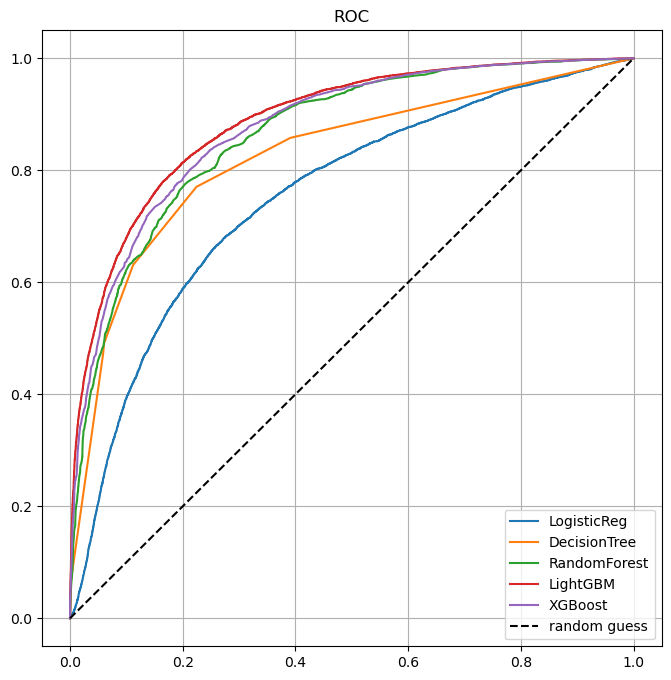

In [130]:
draw_roc_curve(models, model_names, X_test, y_test)

## SMOTE 오버샘플링 GridSearch

### Decision Tree

In [26]:
params = {'max_depth': [3, 5, 7, 10]}

dt = DecisionTreeClassifier(max_depth=3, random_state=13)

dt_gs = GridSearchCV(estimator=dt, param_grid=params, cv = 3, scoring = 'recall')
dt_gs.fit(X_train_over, y_train_over)
dt_gs.best_score_, dt_gs.best_params_

(0.864972337482711, {'max_depth': 3})

In [27]:
dt_sampling_gs = dt_gs.best_estimator_
dt_pred = dt_sampling_gs.predict(X_test)
dt_proba = dt_sampling_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, dt_pred, dt_proba)

=> confusion matrix
[[20149  5828]
 [ 1612  5412]]
Accuracy : 0.7746, Precision : 0.4815
Recall : 0.7705, F1: 0.5926, ROC_AUC: 0.8254


### Logistic Regression

In [23]:
params = {'C': [0.01, 0.1, 1, 10, 100],
              'penalty': ['l1', 'l2'],
              'solver': ['saga', 'liblinear', 'lbfgs'],
              'max_iter': [100, 300, 500]}

lr = LogisticRegression(random_state=13, solver='liblinear')

lr_gs = GridSearchCV(estimator=lr, param_grid=params, cv = 3, n_jobs = -1, scoring = 'recall')
lr_gs.fit(X_train_over,y_train_over)
lr_gs.best_score_, lr_gs.best_params_

(0.7861149531274013,
 {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'})

In [24]:
lr_sampling_gs = lr_gs.best_estimator_
lr_pred = lr_sampling_gs.predict(X_test)
lr_proba = lr_sampling_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, lr_pred, lr_proba)

=> confusion matrix
[[18647  7330]
 [ 2204  4820]]
Accuracy : 0.7111, Precision : 0.3967
Recall : 0.6862, F1: 0.5028, ROC_AUC: 0.7530


### Random Forest

In [28]:
params = {
	'n_estimators':[50, 100, 200],
	'max_depth':[3, 5, 10],
	'min_samples_leaf':[8, 12, 18],
	'min_samples_split':[8, 12, 18]
}

rf = RandomForestClassifier(random_state = 13, n_jobs = -1)

rf_gs = GridSearchCV(estimator = rf, param_grid = params, cv = 3, n_jobs = -1, scoring = 'recall')
rf_gs.fit(X_train_over, y_train_over)
rf_gs.best_score_, rf_gs.best_params_

(0.862705547871523,
 {'max_depth': 3,
  'min_samples_leaf': 18,
  'min_samples_split': 8,
  'n_estimators': 200})

In [29]:
rf_sampling_gs = rf_gs.best_estimator_
rf_pred = rf_sampling_gs.predict(X_test)
rf_proba = rf_sampling_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, rf_pred, rf_proba)

=> confusion matrix
[[21729  4248]
 [ 1983  5041]]
Accuracy : 0.8112, Precision : 0.5427
Recall : 0.7177, F1: 0.6180, ROC_AUC: 0.8653


### LightGBM

In [31]:
params = {
    'boosting_type': ['gbdt'],
    'n_estimators': [100, 300, 1000],
    'max_depth' : [3, 5, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 63, 127],
    'subsample': [0.8],
}

lgbm = LGBMClassifier(random_state = 13, n_jobs = -1, n_estimators = 100, verbose=0)

lgbm_gs = GridSearchCV(estimator = lgbm, param_grid = params, cv = 3, verbose=0, scoring = 'recall')
lgbm_gs = lgbm_gs.fit(X_train_over, y_train_over, eval_set = [(X_test, y_test)], callbacks=[early_stopping(10, verbose=0)])


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [32]:
lgbm_gs.best_score_, lgbm_gs.best_params_

(0.8511314737974489,
 {'boosting_type': 'gbdt',
  'learning_rate': 0.05,
  'max_depth': 3,
  'n_estimators': 1000,
  'num_leaves': 31,
  'subsample': 0.8})

In [33]:
lgbm_sampling_gs = lgbm_gs.best_estimator_
lgbm_pred = lgbm_sampling_gs.predict(X_test)
lgbm_pred_proba = lgbm_sampling_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, lgbm_pred, lgbm_pred_proba)

=> confusion matrix
[[24420  1557]
 [ 2973  4051]]
Accuracy : 0.8627, Precision : 0.7224
Recall : 0.5767, F1: 0.6414, ROC_AUC: 0.8887


### XGBoost

In [34]:
params = {
    'n_estimators': [100, 300, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 10],
    'subsample': [0.8]
}
xgb = XGBClassifier(random_state = 13, n_jobs = -1, verbose = 0)

xgb_gs = GridSearchCV(estimator = xgb, param_grid = params, cv = 3, verbose = 0, n_jobs = -1, scoring = 'recall')
xgb_gs.fit(X_train_over, y_train_over)
xgb_gs.best_score_, xgb_gs.best_params_

(0.8444079452896881,
 {'learning_rate': 0.01,
  'max_depth': 3,
  'n_estimators': 300,
  'subsample': 0.8})

In [35]:
xgb_sampling_gs = xgb_gs.best_estimator_
xgb_pred = xgb_sampling_gs.predict(X_test)
xgb_pred_proba = xgb_sampling_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, xgb_pred, xgb_pred_proba)

=> confusion matrix
[[23512  2465]
 [ 2625  4399]]
Accuracy : 0.8458, Precision : 0.6409
Recall : 0.6263, F1: 0.6335, ROC_AUC: 0.8769


In [37]:
tmp = []
col_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'ROC_AUC']
model_names = ['LogisticReg', 'DecisionTree', 'RandomForest', 'LightGBM', 'XGBoost']

tmp.append(get_clf_eval(y_test, lr_pred, lr_proba))
tmp.append(get_clf_eval(y_test, dt_pred, dt_proba))
tmp.append(get_clf_eval(y_test, rf_pred, rf_proba))
tmp.append(get_clf_eval(y_test, lgbm_pred, lgbm_pred_proba))
tmp.append(get_clf_eval(y_test, xgb_pred, xgb_pred_proba))

result = pd.DataFrame(tmp, columns=col_names, index=model_names)
result

,Accuracy,Precision,Recall,F1,ROC_AUC
LogisticReg,0.711100,0.396708,0.686219,0.502764,0.752995
DecisionTree,0.774552,0.481495,0.770501,0.592641,0.825356
RandomForest,0.811188,0.542685,0.717682,0.618035,0.865268
LightGBM,0.862731,0.722361,0.576737,0.641387,0.888708
XGBoost,0.845762,0.640880,0.626281,0.633497,0.876854


- GridSearch 사용 X 
<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>Accuracy</th>
      <th>Precision</th>
      <th>Recall</th>
      <th>F1</th>
      <th>AUC</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>LogisticReg</th>
      <td>0.711100</td>
      <td>0.396708</td>
      <td>0.686219</td>
      <td>0.502764</td>
      <td>0.753004</td>
    </tr>
    <tr>
      <th>DecisionTree</th>
      <td>0.826975</td>
      <td>0.580991</td>
      <td>0.670985</td>
      <td>0.622754</td>
      <td>0.858570</td>
    </tr>
    <tr>
      <th>RandomForest</th>
      <td>0.827308</td>
      <td>0.580862</td>
      <td>0.677534</td>
      <td>0.625485</td>
      <td>0.872915</td>
    </tr>
    <tr>
      <th>LightGBM</th>
      <td>0.863004</td>
      <td>0.715739</td>
      <td>0.591116</td>
      <td>0.647485</td>
      <td>0.888355</td>
    </tr>
    <tr>
      <th>XGBoost</th>
      <td>0.810581</td>
      <td>0.536989</td>
      <td>0.798833</td>
      <td>0.642248</td>
      <td>0.886625</td>
    </tr>
  </tbody>
</table>
</div>

- 그리드 서치를 통해 Recall의 성능이 대부분 상승하긴 했지만 XGBoost모델은 Recall 지표가 급격히 떨어진 모습을 보이는 특이점을 보인다.
- 가장 좋은 모델은 DecisionTree와 RandomForest로 결과가 나왔다.

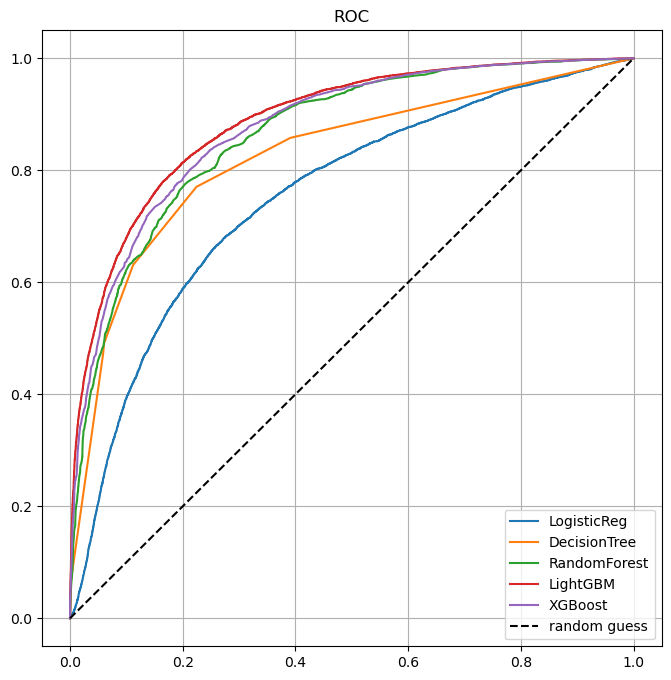

In [112]:
models = [lr_gs, dt_gs, rf_gs, lgbm_gs, xgb_gs]
 
draw_roc_curve(models, model_names, X_test, y_test)

####  max_depth가 recall에 있어서 영향을 주는지 확인

XGBoost 확인

In [17]:
params = {
    'n_estimators': [100, 300, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [8],
    'subsample': [0.8]
}

xgb = XGBClassifier(scale_pos_weight = scale_pos_weight, random_state = 13, max_depth = 3, verbose = 0)

xgb_gs = GridSearchCV(estimator = xgb, param_grid = params, cv = 3, verbose = 0, n_jobs = -1,   scoring='recall')
xgb_gs.fit(X_train, y_train)


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=3,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=13, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1], 'max_depth': [8],
                         'n_estimators': [100, 300, 1000], 'subsample': [0.8]},
             scoring='recall')

In [18]:
xgb_gs.best_score_, xgb_gs.best_params_

(0.7813631637445771,
 {'learning_rate': 0.01,
  'max_depth': 8,
  'n_estimators': 100,
  'subsample': 0.8})

In [19]:
xgb_gs = xgb_gs.best_estimator_
xgb_pred = xgb_gs.predict(X_test)
xgb_pred_proba = xgb_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, xgb_pred, xgb_pred_proba)

=> confusion matrix
[[21415  4562]
 [ 1532  5492]]
Accuracy : 0.8153, Precision : 0.5463
Recall : 0.7819, F1: 0.6432, ROC_AUC: 0.8864


In [20]:
params = {
    'n_estimators': [100, 300, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [10],
    'subsample': [0.8]
}

xgb = XGBClassifier(scale_pos_weight = scale_pos_weight, random_state = 13, max_depth = 3, verbose = 0)

xgb_gs = GridSearchCV(estimator = xgb, param_grid = params, cv = 3, verbose = 0, n_jobs = -1,   scoring='recall')
xgb_gs.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=3,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=13, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1], 'max_depth': [10],
                         'n_estimators': [100, 300, 1000], 'subsample': [0.8]},
             scoring='recall')

In [21]:
xgb_gs.best_score_, xgb_gs.best_params_

(0.7668064967193718,
 {'learning_rate': 0.01,
  'max_depth': 10,
  'n_estimators': 100,
  'subsample': 0.8})

In [22]:
xgb_gs = xgb_gs.best_estimator_
xgb_pred = xgb_gs.predict(X_test)
xgb_pred_proba = xgb_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, xgb_pred, xgb_pred_proba)

=> confusion matrix
[[21612  4365]
 [ 1595  5429]]
Accuracy : 0.8194, Precision : 0.5543
Recall : 0.7729, F1: 0.6456, ROC_AUC: 0.8855


RandomForest 확인

In [42]:
params = {
	'n_estimators':[50, 100, 200],
	'max_depth':[3, 5, 10],
	'min_samples_leaf':[8, 12, 18],
	'min_samples_split':[8, 12, 18]
}

rf = RandomForestClassifier(random_state = 13, n_jobs = -1)

rf_gs = GridSearchCV(estimator = rf, param_grid = params, cv = 3, n_jobs = -1, scoring = 'recall')
rf_gs.fit(X_train_over, y_train_over)

GridSearchCV(cv=3, estimator=RandomForestClassifier(n_jobs=-1, random_state=13),
             n_jobs=-1,
             param_grid={'max_depth': [3, 5, 10],
                         'min_samples_leaf': [8, 12, 18],
                         'min_samples_split': [8, 12, 18],
                         'n_estimators': [50, 100, 200]},
             scoring='recall')

In [52]:
cv_results_df = pd.DataFrame(rf_gs.cv_results_)

# 상위 5개 결과를 평균 테스트 스코어를 기준으로 정렬하여 출력
top_results = cv_results_df.sort_values(by='mean_test_score', ascending=False).head(20)
print(top_results[['params', 'mean_test_score', 'rank_test_score']])

                                               params  mean_test_score  \
20  {'max_depth': 3, 'min_samples_leaf': 18, 'min_...         0.862706   
26  {'max_depth': 3, 'min_samples_leaf': 18, 'min_...         0.862706   
23  {'max_depth': 3, 'min_samples_leaf': 18, 'min_...         0.862706   
11  {'max_depth': 3, 'min_samples_leaf': 12, 'min_...         0.862667   
14  {'max_depth': 3, 'min_samples_leaf': 12, 'min_...         0.862667   
2   {'max_depth': 3, 'min_samples_leaf': 8, 'min_s...         0.862667   
5   {'max_depth': 3, 'min_samples_leaf': 8, 'min_s...         0.862667   
8   {'max_depth': 3, 'min_samples_leaf': 8, 'min_s...         0.862667   
17  {'max_depth': 3, 'min_samples_leaf': 12, 'min_...         0.862667   
21  {'max_depth': 3, 'min_samples_leaf': 18, 'min_...         0.861764   
18  {'max_depth': 3, 'min_samples_leaf': 18, 'min_...         0.861764   
15  {'max_depth': 3, 'min_samples_leaf': 12, 'min_...         0.861764   
0   {'max_depth': 3, 'min_samples_leaf

In [50]:
top_results = cv_results_df.sort_values(by='mean_test_score', ascending=False).tail(10)
print(top_results[['params', 'mean_test_score', 'rank_test_score']])

                                               params  mean_test_score  \
71  {'max_depth': 10, 'min_samples_leaf': 12, 'min...         0.832911   
55  {'max_depth': 10, 'min_samples_leaf': 8, 'min_...         0.832671   
58  {'max_depth': 10, 'min_samples_leaf': 8, 'min_...         0.832671   
56  {'max_depth': 10, 'min_samples_leaf': 8, 'min_...         0.832354   
59  {'max_depth': 10, 'min_samples_leaf': 8, 'min_...         0.832354   
57  {'max_depth': 10, 'min_samples_leaf': 8, 'min_...         0.832113   
54  {'max_depth': 10, 'min_samples_leaf': 8, 'min_...         0.832113   
66  {'max_depth': 10, 'min_samples_leaf': 12, 'min...         0.831316   
63  {'max_depth': 10, 'min_samples_leaf': 12, 'min...         0.831316   
69  {'max_depth': 10, 'min_samples_leaf': 12, 'min...         0.831316   

    rank_test_score  
71               70  
55               73  
58               73  
56               75  
59               75  
57               77  
54               77  
66       

DecisionTree 확인

In [40]:
params = {'max_depth': [3, 5, 7, 10]}

dt = DecisionTreeClassifier(max_depth=3, random_state=13)

dt_gs = GridSearchCV(estimator=dt, param_grid=params, cv = 3, scoring = 'recall')
dt_gs.fit(X_train_over, y_train_over)
dt_gs.best_score_, dt_gs.best_params_

(0.864972337482711, {'max_depth': 3})

In [41]:
results = dt_gs.cv_results_
for params, mean_score, rank in zip(results['params'], results['mean_test_score'], results['rank_test_score']):
    print(f"Params: {params}, Mean Test Score: {mean_score}, Rank: {rank}")

Params: {'max_depth': 3}, Mean Test Score: 0.864972337482711, Rank: 1
Params: {'max_depth': 5}, Mean Test Score: 0.8608325649300753, Rank: 2
Params: {'max_depth': 7}, Mean Test Score: 0.7941447671738128, Rank: 4
Params: {'max_depth': 10}, Mean Test Score: 0.8069674965421854, Rank: 3


- 최종적으로 Recall 성능에 있어서 class_weight로 가중치를 따로 따로 주어 모델을 훈련시켰을 때 오버샘플링에서보다 더 영향을 끼치는 것 같았고, max_depth 또한 Recall에 영향을 주는 것으로 3,5와 같은 작은 값에서 7,10과 같은 큰 값보다 더 좋은 성능을 나오게했다.
- 가장 좋은 모델은 그리드서치를 사용하여 class_weight로 가중치를 준 lightGBM과 scale_pos_weight로 가중치를 준 XGBoost로 나왔다.

### 가장 좋았던 lgbm_gs의 특성 중요도 확인

In [54]:
params = {
    'boosting_type': ['gbdt'],
    'n_estimators': [100, 300, 1000],
    'max_depth' : [3, 5, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 63, 127],
    'subsample': [0.8, 0.9, 1.0],
}

lgbm = LGBMClassifier(class_weight = 'balanced', random_state = 13, verbose = 0)

lgbm_gs = GridSearchCV(estimator = lgbm, param_grid = params, cv = 3,   scoring='recall')
lgbm_gs = lgbm_gs.fit(X_train, y_train, eval_set = [(X_test, y_test)], callbacks=[early_stopping(10, verbose=0)])

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [64]:
lgbm_gs = lgbm_gs.best_estimator_
lgbm_pred = lgbm_gs.predict(X_test)
lgbm_pred_proba = lgbm_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, lgbm_pred, lgbm_pred_proba)

=> confusion matrix
[[18642  6441]
 [ 1133  5262]]
Accuracy : 0.7594, Precision : 0.4496
Recall : 0.8228, F1: 0.5815, ROC_AUC: 0.8660


In [57]:
def get_feature_importance(lgbm_gs, X_train):
    fi = pd.DataFrame(list(zip(X_train.columns, lgbm_gs)), 
                        columns=['Feature', 'Importance']).sort_values(by='Importance', ascending=False)
    return fi

fi = get_feature_importance(lgbm_gs.best_estimator_.feature_importances_, X_train)
fi

,Feature,Importance
1,Age,204
10,IsActiveMember_0.0,202
3,Balance,133
15,NumOfProducts_2,100
14,NumOfProducts_1,40
8,Gender_Female,11
6,Geography_Germany,10
0,CreditScore,0
12,HasCrCard_0.0,0
16,NumOfProducts_3,0


### 이상치 제거

In [58]:
def remove_outlier(df, col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    df = df[(df[col] > lower_bound) & (df[col] < upper_bound)]
    return df

df_age = remove_outlier(train_df, 'Age')
df_clean = remove_outlier(df_age, 'CreditScore')
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 157389 entries, 0 to 165033
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   CreditScore      157389 non-null  int64  
 1   Geography        157389 non-null  object 
 2   Gender           157389 non-null  object 
 3   Age              157389 non-null  float64
 4   Tenure           157389 non-null  int64  
 5   Balance          157389 non-null  float64
 6   NumOfProducts    157389 non-null  int64  
 7   HasCrCard        157389 non-null  float64
 8   IsActiveMember   157389 non-null  float64
 9   EstimatedSalary  157389 non-null  float64
 10  Exited           157389 non-null  int64  
dtypes: float64(5), int64(4), object(2)
memory usage: 14.4+ MB


In [60]:
len(train_df) - len(df_clean)

7615

In [61]:
train_df_encoded = pd.get_dummies(df_clean, columns=['Geography',
                                       'Gender',
                                       'IsActiveMember',
                                       'HasCrCard',
                                       'NumOfProducts'])
train_df_encoded.head(3)

,CreditScore,Age,Tenure,Balance,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male,IsActiveMember_0.0,IsActiveMember_1.0,HasCrCard_0.0,HasCrCard_1.0,NumOfProducts_1,NumOfProducts_2,NumOfProducts_3,NumOfProducts_4
0,668,33.0,3,0.0,181449.97,0,True,False,False,False,True,True,False,False,True,False,True,False,False
1,627,33.0,1,0.0,49503.50,0,True,False,False,False,True,False,True,False,True,False,True,False,False
2,678,40.0,10,0.0,184866.69,0,True,False,False,False,True,True,False,False,True,False,True,False,False


In [63]:
X = train_df_encoded.drop('Exited', axis = 1)
y = train_df_encoded['Exited']

X_train, X_test, y_train, y_test  = train_test_split(X, y, test_size = 0.2, random_state = 13)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((125911, 18), (31478, 18), (125911,), (31478,))

In [65]:
params = {
    'boosting_type': ['gbdt'],
    'n_estimators': [100, 300, 1000],
    'max_depth' : [3, 5, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 63, 127],
    'subsample': [0.8, 0.9, 1.0],
}

lgbm = LGBMClassifier(class_weight = 'balanced', random_state = 13, verbose = 0)

lgbm_gs = GridSearchCV(estimator = lgbm, param_grid = params, cv = 3,   scoring='recall')
lgbm_gs = lgbm_gs.fit(X_train, y_train, eval_set = [(X_test, y_test)], callbacks=[early_stopping(10, verbose=0)])

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [66]:
lgbm_gs = lgbm_gs.best_estimator_
lgbm_pred = lgbm_gs.predict(X_test)
lgbm_pred_proba = lgbm_gs.predict_proba(X_test)[:,1]

print_clf_eval(y_test, lgbm_pred, lgbm_pred_proba)

=> confusion matrix
[[18681  6402]
 [ 1146  5249]]
Accuracy : 0.7602, Precision : 0.4505
Recall : 0.8208, F1: 0.5817, ROC_AUC: 0.8655


In [68]:
fi = get_feature_importance(lgbm_gs.feature_importances_, X_train)
fi

,Feature,Importance
1,Age,222
10,IsActiveMember_0.0,196
3,Balance,125
15,NumOfProducts_2,100
14,NumOfProducts_1,38
6,Geography_Germany,10
8,Gender_Female,9
0,CreditScore,0
12,HasCrCard_0.0,0
16,NumOfProducts_3,0
